## Finance and Risk Analytics 
### By : Nishad Purohit


<a id="intro"></a>
<h1>   
      <font >
            <span style='font-family:Georgia'>
            1. Introduction:
            </span>   
        </font>    
</h1>

<a id="background"></a>
<h2>   
      <font color = Black >
            <span style='font-family:Georgia'>
            1.1 Problem Statement :
            </span>   
        </font>    
</h2>
<p style="text-indent: 25px;">
    <span style='font-family:Georgia'>
        In the recent past, the industry of wealth management has seen a lot of growth. Every individual or business actively searches for opportunities to get the maximum returns. However, in most of the cases, they either lack the skills to identify the right investment opportunity, or there is a shortage of time for finding these opportunities. Hence, this gave rise to the dedicated individuals who perform this task on behalf of the investors for a commission - Portfolio managers.
        </span>
</p>
<p style="text-indent: 25px;">
    <span style='font-family:Georgia'>
        A portfolio manager makes investment decisions and carries out other related activities on behalf of vested investors. They work with a team of analysts and researchers, and their main objective is to realise the needs of the investor and suggest a suitable portfolio that meets all the expectations. They are responsible for establishing the best investment strategy, selecting appropriate investments along with the right allocation. However, in doing so, they face a lot of competition in the form of other portfolio managers and rival firms. Therefore, the portfolio manager has to use the available resources to provide the best solution to the investor.
        </span>
</p>
<p style="text-indent: 25px;">
    <span style='font-family:Georgia'>
        Consider ourselves working for an associate at an investment firm that manages accounts for private clients. Our role requires you to analyse a portfolio of stocks to provide consultation on investment management based on client’s requirement. 
        </span>
</p>

<a id="goal"></a>
<h2>   
      <font color = Black >
            <span style='font-family:Georgia'>
            1.2 Business Goal :
            </span>   
        </font>    
</h2>
<p style="text-indent: 25px;">
    <span style='font-family:Georgia'>
        As a portfolio manager our task is to provide consultation to two different investors, Mr Patrick Jyenger and Mr Peter Jyenger based on their requirements and financial objectives
        <br><br>
        Goal of the Case Study is :
    </span>
</p>
<span style='font-family:Georgia'>
    <ol>
        <li>To Suggest a Portfolio of stocks to Mr Patrick Jyenger based on his risk profile to meet his goal on doubling the amount of 500K Dollars in five years of timespan to buy a minoruty stake in Naturo.</li>
        <li>To Suggest a High risk stocks to Mr Peter Jyenger based on his risk profile to meet his goal on gaining higher returns for the invested amount of 1 Million Dollars over a five years of timespan to use it for the expansion of JWW.</li>
    </ol>
</span>

<a id="intro"></a>
<h1>   
      <font >
            <span style='font-family:Georgia'>
            2. Importing libraries:
            </span>   
        </font>    
</h1>

In [1]:
#Data Analysis & Data wrangling Libraries
import numpy as np
import pandas as pd
from collections import Counter
from functools import reduce
from datetime import datetime
from scipy import stats

# Standard plotly imports
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode

# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)

#Visualization Librarues
import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns
%matplotlib inline

# Plot Style
sns.set_context("paper")
style.use('fivethirtyeight')

# Machine Learning Libraries

#Sci-kit learn libraries

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error


#statsmodel libraries
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from pylab import rcParams

<a id="warning"></a>
<h2>   
      <font color = Black >
            <span style='font-family:Georgia'>
            2.2 Suppress Warnings:
            </span>   
        </font>    
</h2>

In [2]:
# Supress the Warnings
import warnings
warnings.filterwarnings('ignore')

<a id="setup"></a>
<h2>   
      <font color = Black >
            <span style='font-family:Georgia'>
            2.3 Setting up Jupyter View
            </span>   
        </font>    
</h2>

In [3]:
# We can see the max rows & columns with the help of below code
pd.options.display.max_columns = None
pd.options.display.max_rows = None

<a id="import"></a>
<h1>   
      <font color = blue >
            <span style='font-family:Georgia'>
            3. Reading & Understanding the data
            </span>   
        </font>    
</h1>

<a id="input"></a>
<h2 name='libraries'>   
      <font color = Black >
            <span style='font-family:Georgia'>
            3.1 Importing the Input file
            </span>   
        </font>    
</h2>

In [4]:
#Let import the datasets of all stocks 

path = 'C:/Users/Nishad/Desktop/capstone data/'

## AVIATION STOCKS
American_Airlines = pd.read_csv(path + "AAL.csv")
Allegiant_Travel = pd.read_csv(path + "ALGT.csv")
Alaska_Air = pd.read_csv(path + "ALk.csv")
Delta_AirLines = pd.read_csv(path + "DAL.csv")
Hawaiian_Holdings = pd.read_csv(path + "HA.csv")
Southwest_Airlines = pd.read_csv(path + "LUV.csv")

## FINANCE STOCKS
Barclays = pd.read_csv(path + "BCS.csv")
Credit_Suisse = pd.read_csv(path + "CS.csv")
Deutsche_Bank = pd.read_csv(path + "DB.csv")
Goldman_Sachs = pd.read_csv(path + "GS.csv")
Morgan_Stanley = pd.read_csv(path + "MS.csv")
Wells_Fargo = pd.read_csv(path + "WFC.csv")

## HEALTHCARE STOCKS
Johnson_and_Johnson = pd.read_csv(path + "JNJ.csv")
Merck_and_CO = pd.read_csv(path + "MRK.csv")
Pfizer = pd.read_csv(path + "PFE.csv")
UnitedHealthGroup = pd.read_csv(path + "UNH.csv")

## PHARMACEUTICAL STOCKS
Bausch_Health = pd.read_csv(path + "BHC.csv")
Roche_Holding = pd.read_csv(path + "RHHBY.csv")

## TECHNOLOGY STOCKS
Apple = pd.read_csv(path + "AAPL.csv")
Amazon = pd.read_csv(path + "AMZN.csv")
Facebook = pd.read_csv(path + "FB.csv")
Alphabet = pd.read_csv(path + "GOOG.csv")
IBM = pd.read_csv(path + "IBM.csv")
Microsoft = pd.read_csv(path + "MSFT.csv")

#s&p500 Index

SP500 = pd.read_csv(path + "S&P500.csv")

In [5]:
#display first 10 records of the dataframe ad
American_Airlines.head(10)

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,9.29,9.39,9.21,9.29,8.758067,3603800
1,04-10-2010,9.24,9.48,9.05,9.12,8.597802,3856800
2,05-10-2010,9.27,9.35,9.15,9.23,8.701504,3896600
3,06-10-2010,9.27,9.40,9.15,9.23,8.701504,3230200
4,07-10-2010,9.30,9.31,9.07,9.24,8.710930,3877700
5,08-10-2010,9.22,9.26,9.00,9.07,8.550665,4455700
6,11-10-2010,9.06,9.16,9.00,9.00,8.484673,2231500
7,12-10-2010,9.02,9.57,8.94,9.55,9.003184,10884900
8,13-10-2010,9.67,9.90,9.65,9.80,9.238865,7754800
9,14-10-2010,9.76,9.81,9.62,9.78,9.220010,3760500


In [6]:
#Renaming the columns in the dataset and changing the close column to the stock name for easy reference

American_Airlines = American_Airlines.rename(columns = {'Open': 'AAL_Open', 'High': 'AAL_High','Low': 'AAL_Low','Close': 'AAL','Adj Close': 'AAL_Adj Close','Volume': 'AAL_Volume'}, inplace = False)
Allegiant_Travel = Allegiant_Travel.rename(columns = {'Open': 'ALGT_Open', 'High': 'ALGT_High','Low': 'ALGT_Low','Close': 'ALGT','Adj Close': 'ALGT_Adj Close','Volume': 'ALGT_Volume'}, inplace = False)
Alaska_AirLk = Alaska_Air.rename(columns = {'Open': 'ALk_Open', 'High': 'ALk_High','Low': 'ALk_Low','Close': 'ALk','Adj Close': 'ALk_Adj Close','Volume': 'ALk_Volume'}, inplace = False)
Delta_AirLines = Delta_AirLines.rename(columns = {'Open': 'DAL_Open', 'High': 'DAL_High','Low': 'DAL_Low','Close': 'DAL','Adj Close': 'DAL_Adj Close','Volume': 'DAL_Volume'}, inplace = False)
Hawaiian_Holdings = Hawaiian_Holdings.rename(columns = {'Open': 'HA_Open', 'High': 'HA_High','Low': 'HA_Low','Close': 'HA','Adj Close': 'HAL_Adj Close','Volume': 'HAL_Volume'}, inplace = False)
Southwest_Airlines = Southwest_Airlines.rename(columns = {'Open': 'LUV_Open', 'High': 'LUV_High','Low': 'LUV_Low','Close': 'LUV','Adj Close': 'LUV_Adj Close','Volume': 'LUV_Volume'}, inplace = False)

Barclays = Barclays.rename(columns = {'Open': 'BCS_Open', 'High': 'BCS_High','Low': 'BCS_Low','Close': 'BCS','Adj Close': 'BCS_Adj Close','Volume': 'BCS_Volume'}, inplace = False)
Credit_Suisse = Credit_Suisse.rename(columns = {'Open': 'CS_Open', 'High': 'CS_High','Low': 'CS_Low','Close': 'CS','Adj Close': 'CS_Adj Close','Volume': 'CS_Volume'}, inplace = False)
Deutsche_Bank= Deutsche_Bank.rename(columns = {'Open': 'DB_Open', 'High': 'DB_High','Low': 'DB_Low','Close': 'DB','Adj Close': 'DB_Adj Close','Volume': 'DB_Volume'}, inplace = False)
Goldman_Sachs = Goldman_Sachs.rename(columns = {'Open': 'GS_Open', 'High': 'GS_High','Low': 'GS_Low','Close': 'GS','Adj Close': 'GS_Adj Close','Volume': 'GS_Volume'}, inplace = False)
Morgan_Stanley = Morgan_Stanley.rename(columns = {'Open': 'MS_Open', 'High': 'MS_High','Low': 'MS_Low','Close': 'MS','Adj Close': 'MS_Adj Close','Volume': 'MS_Volume'}, inplace = False)
Wells_Fargo = Wells_Fargo.rename(columns = {'Open': 'WFC_Open', 'High': 'WFC_High','Low': 'WFC_Low','Close': 'WFC','Adj Close': 'WFC_Adj Close','Volume': 'WFC_Volume'}, inplace = False)

Johnson_and_Johnson = Johnson_and_Johnson.rename(columns = {'Open': 'JNJ_Open', 'High': 'JNJ_High','Low': 'JNJ_Low','Close': 'JNJ','Adj Close': 'JNJ_Adj Close','Volume': 'JNJ_Volume'}, inplace = False)
Merck_and_CO = Merck_and_CO.rename(columns = {'Open': 'MRK_Open', 'High': 'MRK_High','Low': 'MRK_Low','Close': 'MRK','Adj Close': 'MRK_Adj Close','Volume': 'MRK_Volume'}, inplace = False)
Pfizer = Pfizer.rename(columns = {'Open': 'PFE_Open', 'High': 'PFE_High','Low': 'PFE_Low','Close': 'PFE','Adj Close': 'PFE_Adj Close','Volume': 'PFE_Volume'}, inplace = False)
UnitedHealthGroup = UnitedHealthGroup.rename(columns = {'Open': 'UNH_Open', 'High': 'UNH_High','Low': 'UNH_Low','Close': 'UNH','Adj Close': 'UNH_Adj Close','Volume': 'UNH_Volume'}, inplace = False)

Bausch_Health = Bausch_Health.rename(columns = {'Open': 'BHC_Open', 'High': 'BHC_High','Low': 'BHC_Low','Close': 'BHC','Adj Close': 'BHC_Adj Close','Volume': 'BHC_Volume'}, inplace = False)
Roche_Holding = Roche_Holding.rename(columns = {'Open': 'RHHBY_Open', 'High': 'RHHBY_High','Low': 'RHHBY_Low','Close': 'RHHBY','Adj Close': 'RHHBY_Adj Close','Volume': 'RHHBY_Volume'}, inplace = False)

Apple = Apple.rename(columns = {'Open': 'AAPL_Open', 'High': 'AAPL_High','Low': 'AAPL_Low','Close': 'AAPL','Adj Close': 'AAPL_Adj Close','Volume': 'AAPL_Volume'}, inplace = False)
Amazon = Amazon.rename(columns = {'Open': 'AMZN_Open', 'High': 'AMZN_High','Low': 'AMZN_Low','Close': 'AMZN','Adj Close': 'AMZN_Adj Close','Volume': 'AMZN_Volume'}, inplace = False)
Facebook = Facebook.rename(columns = {'Open': 'FB_Open', 'High': 'FB_High','Low': 'FB_Low','Close': 'FB','Adj Close': 'FB_Adj Close','Volume': 'FB_Volume'}, inplace = False)
Alphabet = Alphabet.rename(columns = {'Open': 'GOOG_Open', 'High': 'GOOG_High','Low': 'GOOG_Low','Close': 'GOOG','Adj Close': 'GOOG_Adj Close','Volume': 'GOOG_Volume'}, inplace = False)
IBM = IBM.rename(columns = {'Open': 'IBM_Open', 'High': 'IBM_High','Low': 'IBM_Low','Close': 'IBM','Adj Close': 'IBM_Adj Close','Volume': 'IBM_Volume'}, inplace = False)
Microsoft = Microsoft.rename(columns = {'Open': 'MSFT_Open', 'High': 'MSFT_High','Low': 'MSFT_Low','Close': 'MSFT','Adj Close': 'MSFT_Adj Close','Volume': 'MSFT_Volume'}, inplace = False)

SP500 = SP500.rename(columns = {'Open': 'S&P500_Open', 'High': 'S&P500_High','Low': 'S&P500_Low','Close': 'S&P500','Adj Close': 'S&P500_Adj Close','Volume': 'S&P500_Volume'}, inplace = False)



In [7]:
# here we are creating the new subsets from the data to do the further processing

# S&P500 index
SP500 = SP500[['Date','S&P500']]

# Aviation stocks
AAL = American_Airlines[['Date','AAL']]
ALGT = Allegiant_Travel[['Date','ALGT']]
ALK = Alaska_AirLk[['Date','ALk']]
DAL = Delta_AirLines[['Date','DAL']]
HA = Hawaiian_Holdings[['Date','HA']]
LUV = Southwest_Airlines[['Date','LUV']]

# Finance stocks
BCS = Barclays[['Date','BCS']]
CS = Credit_Suisse[['Date','CS']]
DB = Deutsche_Bank[['Date','DB']]
GS = Goldman_Sachs[['Date','GS']]
MS = Morgan_Stanley[['Date','MS']]
WFC = Wells_Fargo[['Date','WFC']]

# Pharma_healthcare stocks
BHC = Bausch_Health[['Date','BHC']]
JNJ = Johnson_and_Johnson[['Date','JNJ']]
MRK = Merck_and_CO[['Date','MRK']]
PFE = Pfizer[['Date','PFE']]
RHHBY = Roche_Holding[['Date','RHHBY']]
UNH = UnitedHealthGroup[['Date','UNH']]

# Technology stocks
AAPL = Apple[['Date','AAPL']]
AMZN = Amazon[['Date','AMZN']]
FB = Facebook[['Date','FB']]
GOOG = Alphabet[['Date','GOOG']]
IBM = IBM[['Date','IBM']]
MSFT = Microsoft[['Date','MSFT']]

In [8]:
# Lets merge the subsets of the data into a common dataset
data = pd.merge(SP500, AAL, how='inner', on='Date')
data = pd.merge(data, ALGT, how='inner', on='Date')
data = pd.merge(data, ALK, how='inner', on='Date')
data = pd.merge(data, DAL, how='inner', on='Date')
data = pd.merge(data, HA, how='inner', on='Date')
data = pd.merge(data, LUV, how='inner', on='Date')

data = pd.merge(data, BCS, how='inner', on='Date')
data = pd.merge(data, CS, how='inner', on='Date')
data = pd.merge(data, DB, how='inner', on='Date')
data = pd.merge(data, GS, how='inner', on='Date')
data = pd.merge(data, MS, how='inner', on='Date')
data = pd.merge(data, WFC, how='inner', on='Date')

data = pd.merge(data, BHC, how='inner', on='Date')
data = pd.merge(data, JNJ, how='inner', on='Date')
data = pd.merge(data, MRK, how='inner', on='Date')
data = pd.merge(data, PFE, how='inner', on='Date')
data = pd.merge(data, RHHBY, how='inner', on='Date')
data = pd.merge(data, UNH, how='inner', on='Date')

data = pd.merge(data, AAPL, how='inner', on='Date')
data = pd.merge(data, AMZN, how='inner', on='Date')
data = pd.merge(data, FB, how='inner', on='Date')
data = pd.merge(data, GOOG, how='inner', on='Date')
data = pd.merge(data, IBM, how='inner', on='Date')
data = pd.merge(data, MSFT, how='inner', on='Date')

In [9]:
#Lets check our complete dataset
data.head()

,Date,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
0,18-05-2012,1295.219971,10.06,62.310001,16.170000,10.14,5.28,8.15,10.285714,19.169922,34.370228,95.489998,13.35,30.940001,47.029999,63.349998,37.820000,22.570000,20.160000,53.990002,18.942142,213.850006,38.230000,299.078979,195.880005,29.270000
1,21-05-2012,1315.989990,10.71,62.660000,16.379999,10.58,5.32,8.34,10.672812,19.541016,35.505726,96.510002,13.19,31.400000,47.189999,63.470001,37.599998,22.540001,20.389999,55.549999,20.045713,218.110001,34.029999,305.908386,197.759995,29.750000
2,22-05-2012,1316.630005,10.62,62.349998,16.225000,10.54,5.23,8.27,10.857142,19.863281,35.410305,97.529999,13.31,31.670000,47.779999,63.520000,37.459999,22.370001,20.430000,55.720001,19.891787,215.330002,31.000000,299.278229,196.820007,29.760000
3,23-05-2012,1318.859985,11.00,62.990002,16.115000,10.74,5.38,8.36,10.737328,19.765625,35.381680,98.040001,13.37,31.740000,46.650002,63.270000,37.340000,22.090000,20.075001,55.360001,20.377142,217.279999,32.000000,303.592072,196.119995,29.110001
4,24-05-2012,1320.680054,12.16,64.250000,16.920000,11.27,5.68,8.74,10.746544,19.658203,34.828243,96.860001,13.31,31.809999,48.040001,63.099998,37.599998,22.139999,19.855000,56.220001,20.190001,215.240005,33.029999,300.702881,196.089996,29.070000


<a id="inspect"></a>
<h2 name='libraries'>   
      <font color = Black >
            <span style='font-family:Georgia'>
            3.2 Inspect Dataframe
            </span>   
        </font>    
</h2>

In [10]:
#Lets check the database dimension
print("Database dimension     :",data.shape)
print("Number of Row          :",len(data.index))
print("Number of Columns      :",len(data.columns))

Database dimension     : (2106, 26)
Number of Row          : 2106
Number of Columns      : 26


In [11]:
#Lets check the numerical columns statistics
data.describe()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
count,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000
mean,2273.892283,33.552859,133.642911,56.696432,40.479141,26.177854,38.977840,11.822157,19.199134,23.418093,188.979198,36.923936,47.520798,65.469117,113.375522,61.404653,33.580147,32.943830,159.649582,37.230219,984.016083,119.599425,816.281595,159.660071,76.196852
std,534.027978,13.036814,35.668011,20.649972,14.673069,14.808009,16.480813,3.736298,7.109165,13.237359,38.409585,10.838003,8.998725,61.730865,23.369759,12.786464,4.930604,4.905682,81.072224,20.480593,749.076388,63.839134,337.218474,25.113899,47.698636
min,1278.040039,9.040000,62.259998,16.115000,8.550000,5.220000,8.150000,3.840000,6.670000,5.480000,91.000000,12.360000,22.530001,8.510000,61.779999,37.180000,21.600000,19.430000,51.000000,13.947500,208.220001,17.730000,278.481171,94.769997,26.370001
25%,1895.847473,22.792499,109.180000,38.462499,30.582500,13.132500,26.875001,8.892500,13.192500,11.220000,162.255001,29.365001,43.627500,20.567500,97.940002,52.980000,30.282501,30.526250,81.502500,23.573749,331.909996,68.429998,536.690002,141.279999,41.272500
50%,2132.765014,36.365000,136.060005,62.570002,45.315000,25.920001,41.850001,10.940000,16.304296,18.740000,189.885002,37.295000,49.770000,28.490000,114.684997,58.965000,33.590000,32.514999,138.119995,30.137500,743.445007,118.680000,759.674988,155.095001,56.494999
75%,2736.487549,43.465001,159.899994,69.169998,51.552501,38.437501,53.024999,15.387500,26.477500,34.647500,219.892494,45.657500,54.097499,105.919998,132.887500,68.764998,36.340000,35.700001,240.174996,45.233126,1643.132507,173.980003,1101.962494,182.865005,104.955002
max,3580.840088,58.470001,233.979996,100.239998,63.160000,60.299999,66.290001,19.580000,33.840000,51.898853,273.380005,58.910000,65.930000,262.519989,155.509995,92.040001,46.230000,46.840000,323.700012,134.179993,3531.449951,303.910004,1728.280029,215.800003,231.649994


In [12]:
#Lets check the info about the column types
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2106 entries, 0 to 2105
Data columns (total 26 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2106 non-null   object 
 1   S&P500  2106 non-null   float64
 2   AAL     2106 non-null   float64
 3   ALGT    2106 non-null   float64
 4   ALk     2106 non-null   float64
 5   DAL     2106 non-null   float64
 6   HA      2106 non-null   float64
 7   LUV     2106 non-null   float64
 8   BCS     2106 non-null   float64
 9   CS      2106 non-null   float64
 10  DB      2106 non-null   float64
 11  GS      2106 non-null   float64
 12  MS      2106 non-null   float64
 13  WFC     2106 non-null   float64
 14  BHC     2106 non-null   float64
 15  JNJ     2106 non-null   float64
 16  MRK     2106 non-null   float64
 17  PFE     2106 non-null   float64
 18  RHHBY   2106 non-null   float64
 19  UNH     2106 non-null   float64
 20  AAPL    2106 non-null   float64
 21  AMZN    2106 non-null   float64
 22  

<a id="clean"></a>
<h2 name='libraries'>   
      <font color = Black >
            <span style='font-family:Georgia'>
            3.3 Data Cleaning
            </span>   
        </font>    
</h2>

In [13]:
#display data types of the column in dataframe ad
data.dtypes

Date       object
S&P500    float64
AAL       float64
ALGT      float64
ALk       float64
DAL       float64
HA        float64
LUV       float64
BCS       float64
CS        float64
DB        float64
GS        float64
MS        float64
WFC       float64
BHC       float64
JNJ       float64
MRK       float64
PFE       float64
RHHBY     float64
UNH       float64
AAPL      float64
AMZN      float64
FB        float64
GOOG      float64
IBM       float64
MSFT      float64
dtype: object

As we can see that the date datatype is object, we need to change it to date format 

In [14]:
# lets change the date column to datetime format
data["Date"]= pd.to_datetime(data["Date"], format='%d-%m-%Y')

#display data types of the column in dataframe ad
data.dtypes

Date      datetime64[ns]
S&P500           float64
AAL              float64
ALGT             float64
ALk              float64
DAL              float64
HA               float64
LUV              float64
BCS              float64
CS               float64
DB               float64
GS               float64
MS               float64
WFC              float64
BHC              float64
JNJ              float64
MRK              float64
PFE              float64
RHHBY            float64
UNH              float64
AAPL             float64
AMZN             float64
FB               float64
GOOG             float64
IBM              float64
MSFT             float64
dtype: object

In [15]:
#lets convert the datecolumn as index for our reference
data = data.set_index('Date')

#lets check the data columnn
data.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2012-05-18,1295.219971,10.06,62.310001,16.170000,10.14,5.28,8.15,10.285714,19.169922,34.370228,95.489998,13.35,30.940001,47.029999,63.349998,37.820000,22.570000,20.160000,53.990002,18.942142,213.850006,38.230000,299.078979,195.880005,29.270000
2012-05-21,1315.989990,10.71,62.660000,16.379999,10.58,5.32,8.34,10.672812,19.541016,35.505726,96.510002,13.19,31.400000,47.189999,63.470001,37.599998,22.540001,20.389999,55.549999,20.045713,218.110001,34.029999,305.908386,197.759995,29.750000
2012-05-22,1316.630005,10.62,62.349998,16.225000,10.54,5.23,8.27,10.857142,19.863281,35.410305,97.529999,13.31,31.670000,47.779999,63.520000,37.459999,22.370001,20.430000,55.720001,19.891787,215.330002,31.000000,299.278229,196.820007,29.760000
2012-05-23,1318.859985,11.00,62.990002,16.115000,10.74,5.38,8.36,10.737328,19.765625,35.381680,98.040001,13.37,31.740000,46.650002,63.270000,37.340000,22.090000,20.075001,55.360001,20.377142,217.279999,32.000000,303.592072,196.119995,29.110001
2012-05-24,1320.680054,12.16,64.250000,16.920000,11.27,5.68,8.74,10.746544,19.658203,34.828243,96.860001,13.31,31.809999,48.040001,63.099998,37.599998,22.139999,19.855000,56.220001,20.190001,215.240005,33.029999,300.702881,196.089996,29.070000


In [16]:
# here we need to analyse the data for last 5 years and predict for next 5 years
# i.e. as the client is looking for an investment period of 5 years
data = data['10-01-2015':]
data.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1923.819946,39.200001,217.979996,80.230003,45.410000,24.730000,38.410000,15.01,24.090000,26.520000,176.020004,31.500000,51.439999,179.600006,93.169998,49.369999,31.840000,33.220001,116.610001,27.395000,520.719971,90.949997,611.289978,143.589996,44.610001
2015-10-02,1951.359985,38.630001,215.589996,79.260002,44.869999,24.280001,38.380001,15.39,24.639999,27.139999,177.009995,31.430000,51.259998,182.320007,93.930000,50.139999,33.080002,33.320000,118.830002,27.594999,532.539978,92.070000,626.909973,144.580002,45.570000
2015-10-05,1987.050049,40.189999,216.059998,80.910004,46.959999,25.500000,39.299999,15.60,25.160000,28.200001,180.699997,32.290001,52.410000,163.460007,94.760002,51.230000,33.480000,33.439999,119.650002,27.695000,543.679993,94.010002,641.469971,149.039993,46.630001
2015-10-06,1979.920044,38.130001,208.600006,74.529999,45.090000,24.250000,38.000000,15.55,25.379999,28.400000,180.320007,32.360001,52.029999,166.000000,93.419998,49.799999,32.790001,33.529999,116.050003,27.827499,537.479980,92.800003,645.440002,148.779999,46.750000
2015-10-07,1995.829956,39.310001,213.839996,75.970001,45.990002,24.559999,38.709999,15.73,25.320000,28.790001,182.229996,32.930000,52.189999,169.830002,94.980003,50.950001,33.290001,32.549999,116.430000,27.695000,541.940002,92.400002,642.359985,150.089996,46.799999


<a id="nullcal"></a>
<h2>   
      <font color = Black >
            <span style='font-family:Georgia'>
            3.4 Null Value Calculation
            </span>   
        </font>    
</h2>

In [17]:
data.isnull().sum()

S&P500    0
AAL       0
ALGT      0
ALk       0
DAL       0
HA        0
LUV       0
BCS       0
CS        0
DB        0
GS        0
MS        0
WFC       0
BHC       0
JNJ       0
MRK       0
PFE       0
RHHBY     0
UNH       0
AAPL      0
AMZN      0
FB        0
GOOG      0
IBM       0
MSFT      0
dtype: int64

<h3>   
      <font color = Black >
            <span style='font-family:Georgia'>
            3.4.1 Column wise Null Value calculation
            </span>   
        </font>    
</h3>

In [18]:
#Column wise null values in train data set 
null_perc = pd.DataFrame(round((data.isnull().sum())*100/data.shape[0],2)).reset_index()
null_perc.columns = ['Column Name', 'Null Values Percentage']
null_value = pd.DataFrame(data.isnull().sum()).reset_index()
null_value.columns = ['Column Name', 'Null Values']
null_data = pd.merge(null_value, null_perc, on='Column Name')
null_data.sort_values("Null Values", ascending = False)

,Column Name,Null Values,Null Values Percentage
0,S&P500,0,0.0
13,BHC,0,0.0
23,IBM,0,0.0
22,GOOG,0,0.0
21,FB,0,0.0
20,AMZN,0,0.0
19,AAPL,0,0.0
18,UNH,0,0.0
17,RHHBY,0,0.0
16,PFE,0,0.0


<h3>   
      <font color = Black >
            <span style='font-family:Georgia'>
            3.4.2 Row wise Null Value calculation
            </span>   
        </font>    
</h3>

In [19]:
Row_Null40_Count = len(data[data.isnull().sum(axis=1)/data.shape[1]>0.40])
print( 'Total number of rows with more than 40% null values are : ', Row_Null40_Count)

Total number of rows with more than 40% null values are :  0


In [20]:
#Lets export the cleaned dataset in CSV format
data.to_csv('Final_Cleaned_Dataset.csv')

<a id="eda"></a>
<h1>   
      <font >
            <span style='font-family:Georgia'>
            4. Exploratory Data Analysis:
            </span>   
        </font>    
</h1>

<a id="normal"></a>
<h2>   
      <font color = Black >
            <span style='font-family:Georgia'>
            4.1 Data Normalization
            </span>   
        </font>    
</h2>

In [21]:
# lets assign the dataset to Nomalized data to do the normalization
normalized_data = data.copy()

# Here we are using the Minmax Scaler...The default range for the feature returned by MinMaxScaler is 0 to 1.
scaler = MinMaxScaler()

# here we are calculating the values and appling the values of the parameters on the actual data and gives the normalized value
scaled =scaler.fit_transform(normalized_data.iloc[:])

# reassigning the tranformed dataset to Normalized_data
normalized_data.iloc[:]=scaled

In [22]:
normalized_data.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,0.054083,0.610156,0.938873,0.739045,0.596316,0.311593,0.342763,0.933166,0.903059,0.832608,0.296583,0.263568,0.666129,0.984351,0.000000,0.017952,0.188839,0.333985,0.034410,0.043102,0.012675,0.000000,0.000000,0.559991,0.000000
2015-10-02,0.069804,0.598624,0.924086,0.726395,0.584035,0.302884,0.342056,0.964912,0.931571,0.857143,0.303735,0.261687,0.661982,1.000000,0.012191,0.035673,0.258737,0.338875,0.044761,0.044894,0.016551,0.005259,0.013984,0.571347,0.005133
2015-10-05,0.090178,0.630184,0.926994,0.747913,0.631567,0.326495,0.363743,0.982456,0.958528,0.899090,0.330395,0.284793,0.688479,0.891491,0.025505,0.060759,0.281285,0.344743,0.048585,0.045791,0.020204,0.014369,0.027019,0.622505,0.010800
2015-10-06,0.086108,0.588509,0.880839,0.664710,0.589038,0.302303,0.333098,0.978279,0.969933,0.907004,0.327650,0.286674,0.679723,0.906104,0.004010,0.027848,0.242390,0.349144,0.031799,0.046978,0.018171,0.008687,0.030573,0.619523,0.011441
2015-10-07,0.095190,0.612381,0.913259,0.683490,0.609507,0.308303,0.349835,0.993317,0.966822,0.922438,0.341449,0.301988,0.683410,0.928140,0.029034,0.054315,0.270575,0.301222,0.033571,0.045791,0.019633,0.006809,0.027816,0.634549,0.011709


<a id="visual"></a>
<h2>   
      <font color = Black >
            <span style='font-family:Georgia'>
            4.2 Data Visualization
            </span>   
        </font>    
</h2>

It is always good to visualize the data to better understand the stocks performance.

We will use the interactive library plotly.express for this exercise. This library allows us to interact with the graph: zooming in and out, adding/removing a plot line, saving as image and more.

In [23]:
# with the help of Plotly functions we will plot the graphs

# Note: Here we are ignoring the first column S&P500 as it is the market index

# lets define the function to plot the graph
def visualize(data, addAll = True):
    fig = go.Figure()

    for column in data.columns.to_list()[1:]:
        fig.add_trace(
            go.Scatter(
                x = data.index,
                y = data[column],
                name = column
            )
        )
# defining a "All" button to showcase all the stocks at a time
    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': data.columns[1:].isin(data.columns.to_list()[1:]),
                               'title': 'All',
                               'showlegend':True}])
    
# defining the stocks button to showcase the individual stocks at a time
    def stocks_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': data.columns[1:].isin([column]),
                             'title': column,
                             'showlegend': True}])
    
# after the selection of stock/slider has moved the graph has to be updated
    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(data.columns[1:].map(lambda column: stocks_layout_button(column)))
            
        )
        ])
    
# defining a slider option to increase or decrease the time period    
    fig.update_layout(title_text="Visualizing Actual Stock Values",
                  xaxis_rangeslider_visible=True)
    fig.show()



In [24]:
# lets check the visualization of the stocks without normalization
visualize(data)

In [25]:
# with the help of Plotly functions we will plot the graphs

# Note: Here we are adding the first column S&P500 to check the stocks against the market index

# lets define the function to plot the graph
def visualize1(data, addAll = True):
    fig = go.Figure()

    for column in data.columns.to_list()[:]:
        fig.add_trace(
            go.Scatter(
                x = data.index,
                y = data[column],
                name = column
            )
        )
# defining a "All" button to showcase all the stocks at a time
    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': data.columns[:].isin(data.columns.to_list()[:]),
                               'title': 'All',
                               'showlegend':True}])
    
# defining the stocks button to showcase the individual stocks at a time
    def stocks_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': data.columns.isin([column]),
                             'title': column,
                             'showlegend': True}])
    
# after the selection of stock/slider has moved the graph has to be updated
    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(data.columns[:].map(lambda column: stocks_layout_button(column)))
            
        )
        ])
    
# defining a slider option to increase or decrease the time period    
    fig.update_layout(title_text="Visualizing Normalized Stock Values",
                  xaxis_rangeslider_visible=True)
    fig.show()


In [26]:
# lets visualize the normalized stocks
visualize1(normalized_data)

### Insight:
 
At the end of 5 years we can see that the 8 stocks having returns of greater than 80%

<a id="sector"></a>
<h2>   
      <font color = Black >
            <span style='font-family:Georgia'>
            4.3 Sector Wise Analysis
            </span>   
        </font>    
</h2>

<a id="nullcal"></a>
<h2>   
      <font color = Black >
            <span style='font-family:Georgia'>
            4.3.1 Aviation Sector
            </span>   
        </font>    
</h2>

In [27]:
#Aviation Stocks

Aviation=normalized_data[['S&P500','ALGT','AAL','ALk','DAL',Sector-wise'HA','LUV']]

Aviation.head()

,S&P500,ALGT,AAL,ALk,DAL,HA,LUV
Date,,,,,,,
2015-10-01,0.054083,0.938873,0.610156,0.739045,0.596316,0.311593,0.342763
2015-10-02,0.069804,0.924086,0.598624,0.726395,0.584035,0.302884,0.342056
2015-10-05,0.090178,0.926994,0.630184,0.747913,0.631567,0.326495,0.363743
2015-10-06,0.086108,0.880839,0.588509,0.664710,0.589038,0.302303,0.333098
2015-10-07,0.095190,0.913259,0.612381,0.683490,0.609507,0.308303,0.349835


In [28]:
#lets Visualize the stocks against the same industry along with market index

visualize1(Aviation)

### Insight:

- Aviation Sector has faced major crisis in March 2020 due to Corona Pandemic and the aviation sector has not recovered there after even though the market index has gone up.

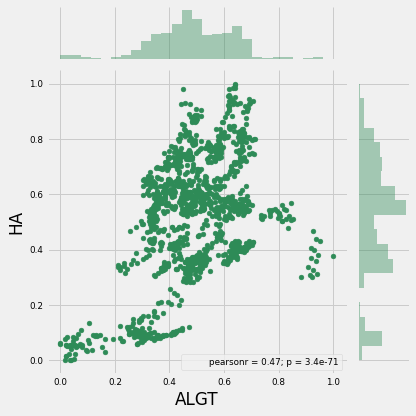

In [29]:
sns.jointplot('ALGT','HA',Aviation,kind='scatter',color='seagreen').annotate(stats.pearsonr)
plt.show()

We can see that pearson coefficint = 0.47.If p value is close to 1 it mease higher positive correlation.If the p values is close to -1 then it means the stock prices have a higher negative correlation.

So we can conclude that HA and ALGT stock prices have less positive correlation.

<a id="nullcal"></a>
<h2>   
      <font color = Black >
            <span style='font-family:Georgia'>
            4.3.2 Finance Sector
            </span>   
        </font>    
</h2>

In [30]:
# Finance Stocks

Finance=normalized_data[['S&P500','BCS','CS','DB','GS','MS','WFC']]

Finance.head()

,S&P500,BCS,CS,DB,GS,MS,WFC
Date,,,,,,,
2015-10-01,0.054083,0.933166,0.903059,0.832608,0.296583,0.263568,0.666129
2015-10-02,0.069804,0.964912,0.931571,0.857143,0.303735,0.261687,0.661982
2015-10-05,0.090178,0.982456,0.958528,0.899090,0.330395,0.284793,0.688479
2015-10-06,0.086108,0.978279,0.969933,0.907004,0.327650,0.286674,0.679723
2015-10-07,0.095190,0.993317,0.966822,0.922438,0.341449,0.301988,0.683410


In [31]:
#lets Visualize the stocks against the same industry along with market index

visualize1(Finance)

### Insight:

- Finance Sector has also faced crisis in March 2020 due to Corona Pandemic and the Finace sector has recovered a bit although majority of stocks has been hit.


- Morgan Stanley & Goldman Sachs have performed well when compared to other stocks

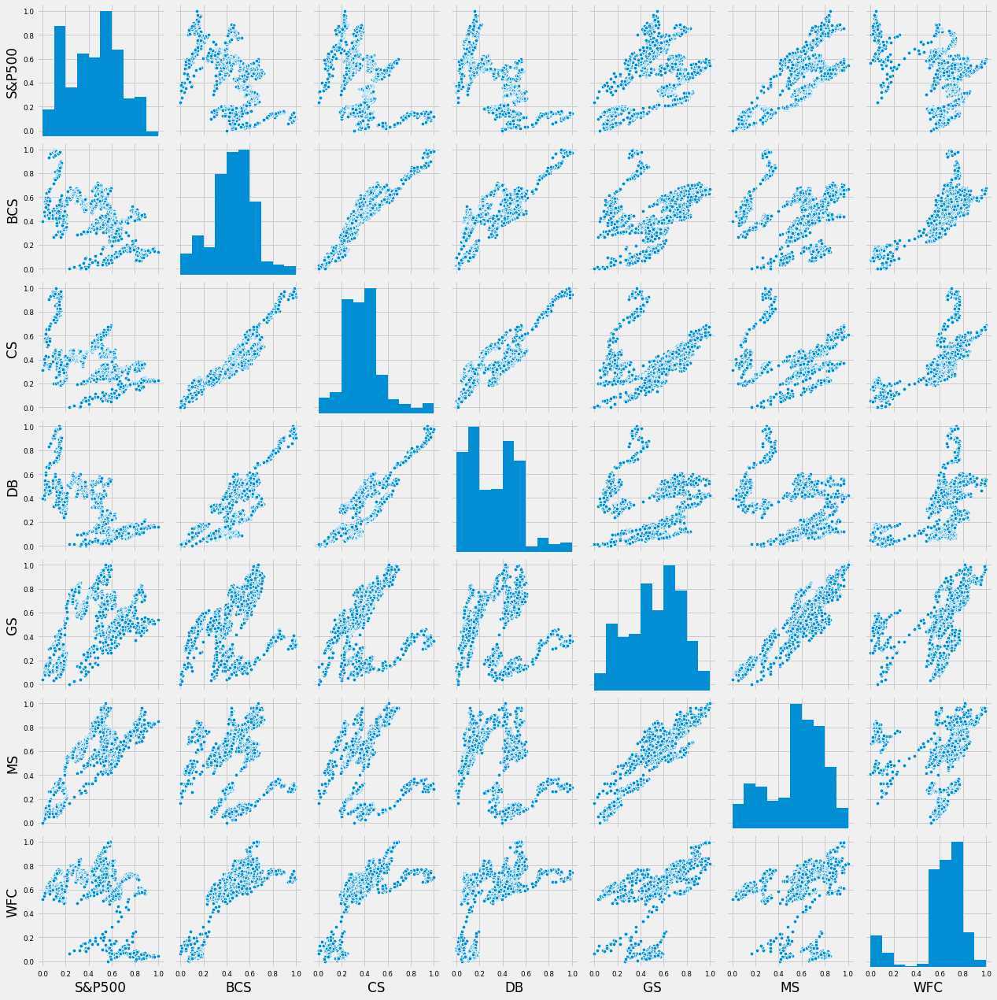

In [32]:
sns.pairplot(Finance, kind = 'scatter')
plt.ioff()

Here we can see that Goldman Sachs & Morgan stanley are highly correlated when compared to others stocks

<a id="nullcal"></a>
<h2>   
      <font color = Black >
            <span style='font-family:Georgia'>
            4.3.3 Pharma Sector
            </span>   
        </font>    
</h2>

In [33]:
#pharma & healthcare stocks

Pharma=normalized_data[['S&P500','BHC','JNJ','MRK','PFE','RHHBY','UNH']]

Pharma.head()

,S&P500,BHC,JNJ,MRK,PFE,RHHBY,UNH
Date,,,,,,,
2015-10-01,0.054083,0.984351,0.000000,0.017952,0.188839,0.333985,0.034410
2015-10-02,0.069804,1.000000,0.012191,0.035673,0.258737,0.338875,0.044761
2015-10-05,0.090178,0.891491,0.025505,0.060759,0.281285,0.344743,0.048585
2015-10-06,0.086108,0.906104,0.004010,0.027848,0.242390,0.349144,0.031799
2015-10-07,0.095190,0.928140,0.029034,0.054315,0.270575,0.301222,0.033571


In [34]:
#lets Visualize the stocks against the same industry along with market index

visualize1(Pharma)

### Insight:

- Pharma & Health care Sector has also faced crisis in March 2020 due to Corona Pandemic but the recovery rate shown by this sector is commendable.


- United Health, Johnson & Johsnson have performed well when compared to S&P Index.


- Bausch Helath is consistently performed very badly over the years when compared to other stocks in the same sector.

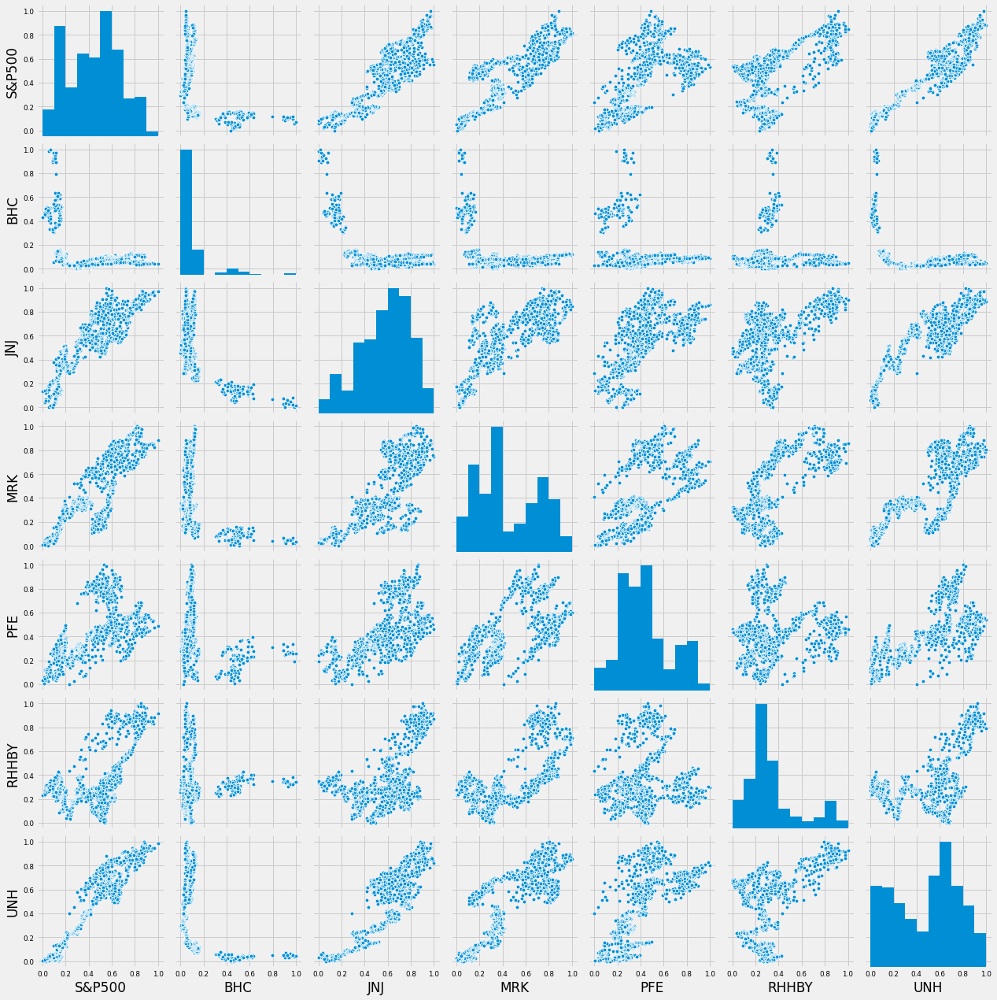

In [35]:
sns.pairplot(Pharma)
plt.ioff()

<a id="nullcal"></a>
<h2>   
      <font color = Black >
            <span style='font-family:Georgia'>
            4.3.4 Technology Sector
            </span>   
        </font>    
</h2>

In [36]:
# Technology Stocks

Technology = normalized_data[['S&P500','AAPL','AMZN','FB','GOOG','IBM','MSFT']]

Technology.tail()

,S&P500,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,
2020-09-24,0.809192,0.767373,0.832209,0.744647,0.731430,0.267493,0.847840
2020-09-25,0.838802,0.803755,0.856915,0.769487,0.746354,0.277357,0.872594
2020-09-28,0.869137,0.827770,0.882796,0.778879,0.763865,0.309245,0.881255
2020-09-29,0.859929,0.819974,0.873230,0.802216,0.768172,0.300184,0.869600
2020-09-30,0.875645,0.835387,0.874493,0.802733,0.768413,0.308557,0.886014


In [37]:
#lets Visualize the stocks against the same industry along with market index
visualize1(Technology)

### Insight:

- Technology Sector has also faced crisis in March 2020 due to Covid Pandemic but the recovery rate shown by this sector is commendable.


- Microsoft, Amazon, Apple, Facebook & Google have performed well along with Market index.


- IBM is consistently performed very badly over the years when compared to other stocks in the same sector.

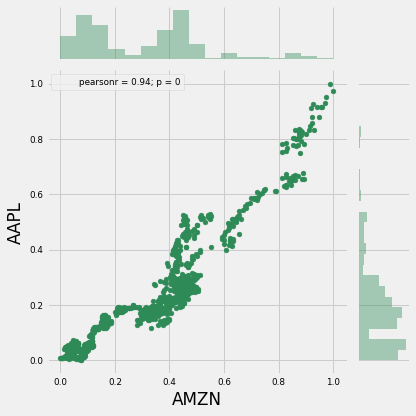

In [38]:
sns.jointplot('AMZN','AAPL',Technology,kind='scatter',color='seagreen').annotate(stats.pearsonr)
plt.show()

We can see that pearson coefficint = 0.94.If p value is close to 1 it mease higher positive correlation.If the p values is close to -1 then it means the stock prices have a higher negative correlation.So we can conclude that Apple and Amazon stock prices have high positive correlation.

<a id="metrics"></a>
<h2>   
      <font color = Black >
            <span style='font-family:Georgia'>
            4.4 Key Metrics
            </span>   
        </font>    
</h2>

<h2>   
      <font color = Black >
            <span style='font-family:Georgia'>
            4.4.1 Daily Returns
            </span>   
        </font>    
</h2>

A return, also known as a financial return, in its simplest terms, is the money made or lost on an investment over some period of time.

- A return is a percentage defined as the change of price expressed as a fraction of the initial price.

- Returns exhibit more attractive statistical properties than asset prices themselves. Therefore it also makes more statistical sense to analyze return data rather than price series.

We will use formula and pandas built in function pct_change to compute the simple returns for each day, each stock in our dataset.

In [39]:
# lets assign the dataset to daily_returns
daily_returns = data.copy()

# using a loop function to calculate the percentage change

for i in list(daily_returns.columns[:]):
    daily_returns[i]=daily_returns[i].pct_change(1)  # Percentage change between the current and a prior element

In [40]:
visualize(daily_returns)

In [41]:
#lets see the correaltion for the daily returns
correlated_data = daily_returns.corr(method='pearson')

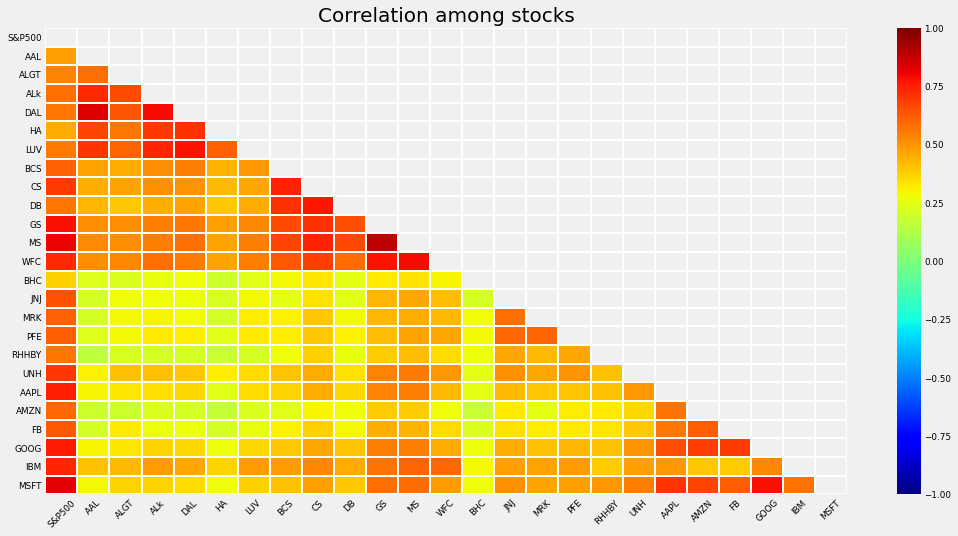

In [42]:
#Lets plot the heatmap
plt.figure(figsize=(16,8))
mask = np.zeros_like(correlated_data)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(correlated_data, cmap='jet', vmax=1.0, vmin=-1.0 , mask = mask, linewidths=1.0)
plt.yticks(rotation=0) 
plt.xticks(rotation=45) 
plt.title('Correlation among stocks', fontsize = 20)
plt.show()

From the above Graph we can see that 
- Microsoft & Google stocks are highly correlated in the Techonolgy Stocks
- Goldman Sachs, Morgan Stanley & WellsFargo are correlated in the Finance Stocks
- American Airlines & Delta Airlines are more correlated than Alaska Air Group in the Aviation stocks
- Pharma stocks are less correlated when comapred to any other sector stocks

In [43]:
# with the help of Plotly functions we will plot the graphs

# Note: Here we are ignoring the first column S&P500 as it is the market index

# lets define the function to plot the graph

def dispersion_plot(data, addAll = True):
    fig = go.Figure()

    for column in data.columns.to_list()[1:]:
        fig.add_trace(
            go.Histogram(
                x = data[column],
                name = column
            )
            
        )
# defining a "All" button to showcase all the stocks at a time
    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': data.columns[1:].isin(data.columns.to_list()[1:]),
                               'title': 'All',
                               'showlegend':True}])
    
# defining the stocks button to showcase the individual stocks at a time
    def stocks_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': data.columns[1:].isin([column]),
                             'title': column,
                             'showlegend': True}])
    
# after the selection of stock/slider has moved the graph has to be updated
    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(data.columns[1:].map(lambda column: stocks_layout_button(column)))
            )
        ])
    
# defining a slider option to increase or decrease the time period       
    fig.update_layout(title_text="Stock Price Dispersion from Mean",
                  xaxis_rangeslider_visible=True)
    fig.show()

    
#lets plot the graph
dispersion_plot(daily_returns)


We can see that most of the Daily returns value is centred around zero.

<a id="nullcal"></a>
<h2>   
      <font color = Black >
            <span style='font-family:Georgia'>
            4.4.2 Cumulative Daily Returns
            </span>   
        </font>    
</h2>

In [44]:
# Lets Calculate the cumulative daily returns
df_cum_daily_returns = (1 + daily_returns).cumprod() - 1

df_cum_daily_returns.tail()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-24,0.687575,-0.699745,-0.442609,-0.555029,-0.361154,-0.498585,-0.040354,-0.683544,-0.600664,-0.694193,0.108454,0.479683,-0.546656,-0.915256,0.552753,0.684221,0.123116,0.345575,1.509733,2.950356,4.799259,1.743595,1.336518,-0.177589,3.554808
2020-09-25,0.714537,-0.686480,-0.432241,-0.542565,-0.344197,-0.482410,-0.034106,-0.686875,-0.606476,-0.698341,0.107545,0.493333,-0.540435,-0.914811,0.563379,0.679765,0.132224,0.349187,1.594117,3.098558,4.943943,1.801759,1.363788,-0.171600,3.658597
2020-09-28,0.742159,-0.674490,-0.416873,-0.532095,-0.309844,-0.458957,-0.004426,-0.667555,-0.589041,-0.682127,0.130951,0.535873,-0.536936,-0.914978,0.578942,0.676322,0.142902,0.327815,1.600377,3.196386,5.095503,1.823749,1.395786,-0.152239,3.694911
2020-09-29,0.733775,-0.687500,-0.444490,-0.542939,-0.325919,-0.479984,-0.020828,-0.669554,-0.591947,-0.688160,0.117998,0.499683,-0.547823,-0.917149,0.578405,0.658902,0.135992,0.305539,1.608267,3.164628,5.039484,1.878395,1.403655,-0.157741,3.646043
2020-09-30,0.748085,-0.686480,-0.450408,-0.543438,-0.326580,-0.478771,-0.023692,-0.666223,-0.586135,-0.683258,0.141745,0.534921,-0.542963,-0.913474,0.597939,0.680170,0.152638,0.288682,1.673613,3.227414,5.046878,1.879604,1.404096,-0.152657,3.714862


In [45]:
# Since we calculated returns the first row for Returns and CumReturns will be null
# Delete the null rows as they are not relevant for our calculations

daily_returns.dropna(axis = 0, inplace = True)
df_cum_daily_returns.dropna(axis = 0, inplace = True)


In [46]:
#Lets check the null row has been removed or not
daily_returns.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-02,0.014315,-0.014541,-0.010964,-0.012090,-0.011892,-0.018196,-0.000781,0.025316,0.022831,0.023379,0.005624,-0.002222,-0.003499,0.015145,0.008157,0.015597,0.038945,0.003010,0.019038,0.007301,0.022699,0.012314,0.025553,0.006895,0.021520
2015-10-05,0.018290,0.040383,0.002180,0.020818,0.046579,0.050247,0.023971,0.013645,0.021104,0.039057,0.020846,0.027362,0.022435,-0.103444,0.008836,0.021739,0.012092,0.003601,0.006901,0.003624,0.020919,0.021071,0.023225,0.030848,0.023261
2015-10-06,-0.003588,-0.051256,-0.034527,-0.078853,-0.039821,-0.049020,-0.033079,-0.003205,0.008744,0.007092,-0.002103,0.002168,-0.007251,0.015539,-0.014141,-0.027913,-0.020609,0.002691,-0.030088,0.004784,-0.011404,-0.012871,0.006189,-0.001744,0.002573
2015-10-07,0.008036,0.030947,0.025120,0.019321,0.019960,0.012783,0.018684,0.011576,-0.002364,0.013732,0.010592,0.017614,0.003075,0.023072,0.016699,0.023092,0.015249,-0.029228,0.003274,-0.004761,0.008298,-0.004310,-0.004772,0.008805,0.001069
2015-10-08,0.008818,0.010939,-0.005518,-0.002764,-0.000652,0.062296,0.001292,0.005086,-0.031201,-0.013894,-0.006366,0.001822,0.006706,0.007890,0.001053,0.001374,-0.006008,0.021505,-0.003006,-0.011554,-0.016201,0.000758,-0.004982,0.014591,0.013889


In [47]:
df_cum_daily_returns.tail()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-24,0.687575,-0.699745,-0.442609,-0.555029,-0.361154,-0.498585,-0.040354,-0.683544,-0.600664,-0.694193,0.108454,0.479683,-0.546656,-0.915256,0.552753,0.684221,0.123116,0.345575,1.509733,2.950356,4.799259,1.743595,1.336518,-0.177589,3.554808
2020-09-25,0.714537,-0.686480,-0.432241,-0.542565,-0.344197,-0.482410,-0.034106,-0.686875,-0.606476,-0.698341,0.107545,0.493333,-0.540435,-0.914811,0.563379,0.679765,0.132224,0.349187,1.594117,3.098558,4.943943,1.801759,1.363788,-0.171600,3.658597
2020-09-28,0.742159,-0.674490,-0.416873,-0.532095,-0.309844,-0.458957,-0.004426,-0.667555,-0.589041,-0.682127,0.130951,0.535873,-0.536936,-0.914978,0.578942,0.676322,0.142902,0.327815,1.600377,3.196386,5.095503,1.823749,1.395786,-0.152239,3.694911
2020-09-29,0.733775,-0.687500,-0.444490,-0.542939,-0.325919,-0.479984,-0.020828,-0.669554,-0.591947,-0.688160,0.117998,0.499683,-0.547823,-0.917149,0.578405,0.658902,0.135992,0.305539,1.608267,3.164628,5.039484,1.878395,1.403655,-0.157741,3.646043
2020-09-30,0.748085,-0.686480,-0.450408,-0.543438,-0.326580,-0.478771,-0.023692,-0.666223,-0.586135,-0.683258,0.141745,0.534921,-0.542963,-0.913474,0.597939,0.680170,0.152638,0.288682,1.673613,3.227414,5.046878,1.879604,1.404096,-0.152657,3.714862


Last record of the dataframe multiplied by 100 is giving us the percentage change of the stock prices for our entire period

In [48]:
#selecting the last row and assigning it to a data frame
Cum_daily_returns = df_cum_daily_returns.iloc[:, :].tail(1)

# lets round off the values by mulitplying with 100
Cum_daily_returns = Cum_daily_returns * 100

# lets check the dataframe
Cum_daily_returns

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-30,74.808459,-68.64796,-45.040827,-54.343762,-32.658005,-47.877072,-2.369175,-66.622252,-58.613533,-68.325792,14.174524,53.492057,-54.296267,-91.347439,59.793934,68.017012,15.263822,28.868151,167.361278,322.741369,504.68777,187.960421,140.40963,-15.265686,371.486208


In [49]:
# Lets reset the index

Cum_daily_returns = Cum_daily_returns.reset_index()

# Lets transpose the dataframe 
Cum_daily_returns = Cum_daily_returns.transpose()

# Removing the date row & selecting only the stocks as per our requirement
Cum_daily_returns = Cum_daily_returns[1:]

# Renaming the column from Zero to Cumulative Returns
Cum_daily_returns = Cum_daily_returns.rename(columns = {0: 'Cumulative Returns'}, inplace = False)

# Sorting the values by descending order
Cum_daily_returns = Cum_daily_returns.sort_values('Cumulative Returns', ascending = False)

# lets check the dataframe
Cum_daily_returns

,Cumulative Returns
AMZN,504.688
MSFT,371.486
AAPL,322.741
FB,187.96
UNH,167.361
GOOG,140.41
S&P500,74.8085
MRK,68.017
JNJ,59.7939
MS,53.4921


In [50]:
# changing the datatype to float from object
Cum_daily_returns['Cumulative Returns'] = Cum_daily_returns['Cumulative Returns'].astype(float, errors = 'raise')

# round off the values by 2 decimal points for easy refernce
Cum_daily_returns = round(Cum_daily_returns['Cumulative Returns'], 2)

# lets check the dataframe
Cum_daily_returns

AMZN      504.69
MSFT      371.49
AAPL      322.74
FB        187.96
UNH       167.36
GOOG      140.41
S&P500     74.81
MRK        68.02
JNJ        59.79
MS         53.49
RHHBY      28.87
PFE        15.26
GS         14.17
LUV        -2.37
IBM       -15.27
DAL       -32.66
ALGT      -45.04
HA        -47.88
WFC       -54.30
ALk       -54.34
CS        -58.61
BCS       -66.62
DB        -68.33
AAL       -68.65
BHC       -91.35
Name: Cumulative Returns, dtype: float64

<a id="nullcal"></a>
<h2>   
      <font color = Black >
            <span style='font-family:Georgia'>
            4.4.3 Calculation of Sharpe Ratio, Annual Risk & Annaul returns
            </span>   
        </font>    
</h2>

In [51]:
#lets get some information about the daily_returns
daily_returns.describe()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000
mean,0.000517,-0.000336,-0.000047,-0.000256,0.000042,0.000034,0.000245,-0.000548,-0.000437,-0.000529,0.000303,0.000578,-0.000414,-0.000897,0.000451,0.000511,0.000209,0.000293,0.000941,0.001322,0.001611,0.001050,0.000834,-0.000002,0.001387
std,0.012080,0.034725,0.029101,0.026907,0.026478,0.033132,0.022913,0.025119,0.022842,0.027743,0.019899,0.021810,0.020349,0.044551,0.012459,0.014067,0.013826,0.013514,0.017810,0.018729,0.018969,0.020354,0.016520,0.016086,0.017539
min,-0.119841,-0.252246,-0.283300,-0.232385,-0.259924,-0.264971,-0.151094,-0.218519,-0.182598,-0.174888,-0.127053,-0.156000,-0.158676,-0.514629,-0.100379,-0.088990,-0.077346,-0.089609,-0.172769,-0.128647,-0.079221,-0.189609,-0.111008,-0.128507,-0.147390
25%,-0.002938,-0.013623,-0.011305,-0.010721,-0.009714,-0.014908,-0.009222,-0.010787,-0.010442,-0.014976,-0.008386,-0.009023,-0.007917,-0.019678,-0.004277,-0.006240,-0.005856,-0.006237,-0.006644,-0.006179,-0.006716,-0.007223,-0.005788,-0.006498,-0.005893
50%,0.000682,-0.000480,-0.000363,0.000206,0.000783,0.000342,0.000618,0.000000,0.000000,-0.001051,0.000299,0.000445,-0.000362,-0.000501,0.000493,0.000245,0.000115,0.000229,0.000809,0.000951,0.001636,0.001193,0.000973,0.000483,0.001225
75%,0.005213,0.013233,0.011630,0.010619,0.009781,0.015078,0.009990,0.010215,0.010416,0.013872,0.009704,0.010451,0.007589,0.018022,0.005921,0.007616,0.006372,0.006919,0.008161,0.009911,0.010765,0.010880,0.008785,0.006879,0.009161
max,0.093828,0.410970,0.292428,0.203079,0.210171,0.245837,0.144441,0.151042,0.163447,0.140244,0.175803,0.197700,0.145347,0.337444,0.079977,0.104080,0.089607,0.130118,0.127989,0.119808,0.132164,0.155214,0.104485,0.113011,0.142169


In [52]:
# here we need mean and standard deviation of all the stocks 
df_daily_returns = daily_returns.describe()[1:8].T.sort_values('mean', ascending = False) # sorting the values by mean

# dropping the unnecessary columns
df = df_daily_returns.drop(['25%', '50%', '75%'], axis = 1)

# Renaming the columns names 
df = df.rename(columns = {'mean': 'Avg Daily Returns', 'std':'Risk', "min": "Min", "max" : "Max" }, inplace = False)

# lets check the dataframe
df

,Avg Daily Returns,Risk,Min,Max
AMZN,0.001611,0.018969,-0.079221,0.132164
MSFT,0.001387,0.017539,-0.147390,0.142169
AAPL,0.001322,0.018729,-0.128647,0.119808
FB,0.001050,0.020354,-0.189609,0.155214
UNH,0.000941,0.017810,-0.172769,0.127989
GOOG,0.000834,0.016520,-0.111008,0.104485
MS,0.000578,0.021810,-0.156000,0.197700
S&P500,0.000517,0.012080,-0.119841,0.093828
MRK,0.000511,0.014067,-0.088990,0.104080
JNJ,0.000451,0.012459,-0.100379,0.079977


In [53]:
# Lets calculate Annualized Returns

# As per the industry practice here we take 252 days as the number of working days of a stock market 
df["Annualized_Returns"] = df["Avg Daily Returns"]*252

#Lets calculate Annualized risk

df["Annualized_Risk"] = np.sqrt(252) * df["Risk"]

# Lets Calculate the Sharpe Ratio

# here we are considering the risk free rate as 0.75%
df["Sharpe_Ratio"] = ((df["Annualized_Returns"] - 0.0075) / df["Annualized_Risk"]) / 100 #we have divided by 100 to cancel the roundoff 

# lets see the dataframe
df

,Avg Daily Returns,Risk,Min,Max,Annualized_Returns,Annualized_Risk,Sharpe_Ratio
AMZN,0.001611,0.018969,-0.079221,0.132164,0.405855,0.301117,0.013229
MSFT,0.001387,0.017539,-0.147390,0.142169,0.349535,0.278430,0.012284
AAPL,0.001322,0.018729,-0.128647,0.119808,0.333182,0.297317,0.010954
FB,0.001050,0.020354,-0.189609,0.155214,0.264524,0.323113,0.007955
UNH,0.000941,0.017810,-0.172769,0.127989,0.237197,0.282731,0.008124
GOOG,0.000834,0.016520,-0.111008,0.104485,0.210194,0.262253,0.007729
MS,0.000578,0.021810,-0.156000,0.197700,0.145536,0.346215,0.003987
S&P500,0.000517,0.012080,-0.119841,0.093828,0.130407,0.191765,0.006409
MRK,0.000511,0.014067,-0.088990,0.104080,0.128832,0.223306,0.005433
JNJ,0.000451,0.012459,-0.100379,0.079977,0.113527,0.197781,0.005361


In [54]:
# lets round off the values by mulitplying with 100
df = df*100

# round off the values by 2 decimal points for easy refernce
df = round(df, 2)

# lets check the dataframe
df

,Avg Daily Returns,Risk,Min,Max,Annualized_Returns,Annualized_Risk,Sharpe_Ratio
AMZN,0.16,1.90,-7.92,13.22,40.59,30.11,1.32
MSFT,0.14,1.75,-14.74,14.22,34.95,27.84,1.23
AAPL,0.13,1.87,-12.86,11.98,33.32,29.73,1.10
FB,0.10,2.04,-18.96,15.52,26.45,32.31,0.80
UNH,0.09,1.78,-17.28,12.80,23.72,28.27,0.81
GOOG,0.08,1.65,-11.10,10.45,21.02,26.23,0.77
MS,0.06,2.18,-15.60,19.77,14.55,34.62,0.40
S&P500,0.05,1.21,-11.98,9.38,13.04,19.18,0.64
MRK,0.05,1.41,-8.90,10.41,12.88,22.33,0.54
JNJ,0.05,1.25,-10.04,8.00,11.35,19.78,0.54


In [55]:
df_final = pd.concat([df, Cum_daily_returns], axis=1)

df_final

,Avg Daily Returns,Risk,Min,Max,Annualized_Returns,Annualized_Risk,Sharpe_Ratio,Cumulative Returns
AMZN,0.16,1.90,-7.92,13.22,40.59,30.11,1.32,504.69
MSFT,0.14,1.75,-14.74,14.22,34.95,27.84,1.23,371.49
AAPL,0.13,1.87,-12.86,11.98,33.32,29.73,1.10,322.74
FB,0.10,2.04,-18.96,15.52,26.45,32.31,0.80,187.96
UNH,0.09,1.78,-17.28,12.80,23.72,28.27,0.81,167.36
GOOG,0.08,1.65,-11.10,10.45,21.02,26.23,0.77,140.41
MS,0.06,2.18,-15.60,19.77,14.55,34.62,0.40,53.49
S&P500,0.05,1.21,-11.98,9.38,13.04,19.18,0.64,74.81
MRK,0.05,1.41,-8.90,10.41,12.88,22.33,0.54,68.02
JNJ,0.05,1.25,-10.04,8.00,11.35,19.78,0.54,59.79


### Insight:
 
At the end of 5 years we can see that the top 8 stocks having returns of greater than 80% are as follows
- AMZN gives 40.59% annual returns
- MSFT gives 34.95% annual returns
- AAPL gives 33.32% annual returns
- FB gives 26.45% annual returns
- UNH gives 23.72% annual returns
- GOOG gives 21.02% annual returns
- MS gives 14.55% annual returns
- S&P500 gives 13.04% annual returns


In [56]:
#df_final[0] = df_final[0].astype(float, errors = 'raise')
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 25 entries, AMZN to BHC
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Avg Daily Returns   25 non-null     float64
 1   Risk                25 non-null     float64
 2   Min                 25 non-null     float64
 3   Max                 25 non-null     float64
 4   Annualized_Returns  25 non-null     float64
 5   Annualized_Risk     25 non-null     float64
 6   Sharpe_Ratio        25 non-null     float64
 7   Cumulative Returns  25 non-null     float64
dtypes: float64(8)
memory usage: 1.8+ KB


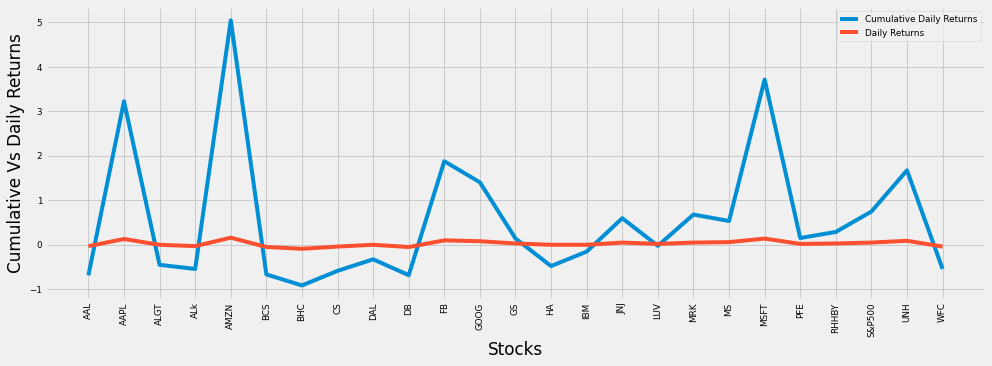

In [57]:
# Line chart showing Cumulative returns of stocks

plt.figure(figsize=(15,5))
sns.lineplot(data=df_final['Cumulative Returns']/100, label="Cumulative Daily Returns")
sns.lineplot(data=df_final['Avg Daily Returns'], label="Daily Returns")

# Add label for horizontal axis
plt.xlabel("Stocks")

#rotate the labels
plt.xticks(rotation = 90)

# Add label for horizontal axis
plt.ylabel("Cumulative Vs Daily Returns")

plt.show()

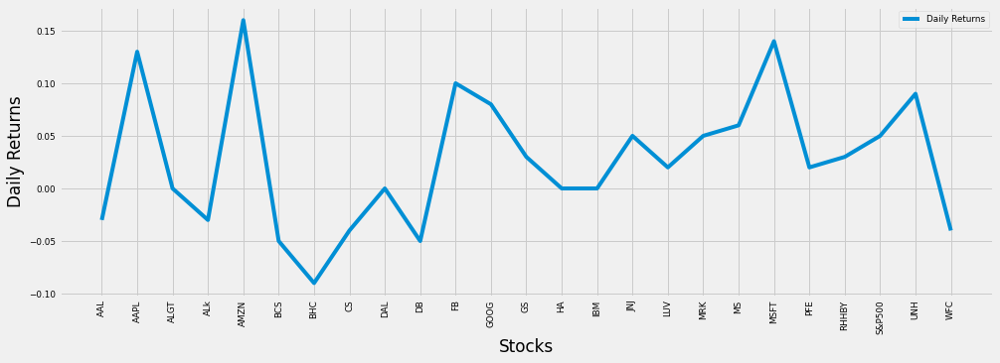

In [58]:
# Line chart showing daily returns of stocks

plt.figure(figsize=(15,5))
sns.lineplot(data=df_final['Avg Daily Returns'], label="Daily Returns")

# Add label for horizontal axis
plt.xlabel("Stocks")

#rotate the labels
plt.xticks(rotation = 90)

# Add label for horizontal axis
plt.ylabel("Daily Returns")

plt.show()

### Insight:
- We can see that Apple, Amazon, Facebook, Google, Micrososft, United health have given better daily returns.

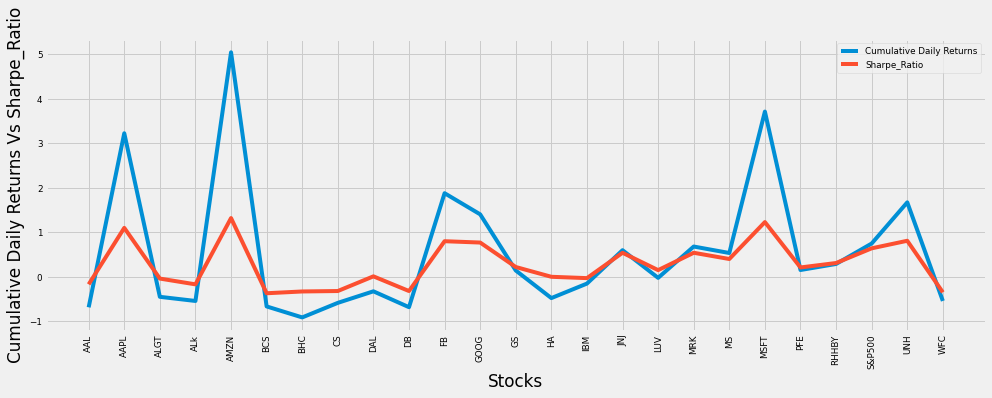

In [59]:
# Line chart showing Cumulative returns of stocks

plt.figure(figsize=(15,5))
sns.lineplot(data=df_final['Cumulative Returns']/100, label="Cumulative Daily Returns")
sns.lineplot(data=df_final['Sharpe_Ratio'], label="Sharpe_Ratio")

# Add label for horizontal axis
plt.xlabel("Stocks")

#rotate the labels
plt.xticks(rotation = 90)

# Add label for horizontal axis
plt.ylabel("Cumulative Daily Returns Vs Sharpe_Ratio")

plt.show()

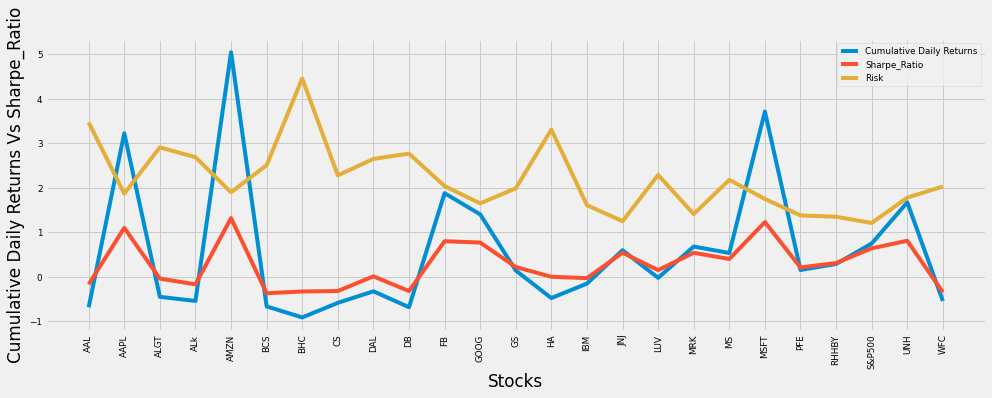

In [60]:
# Line chart showing Cumulative returns of stocks

plt.figure(figsize=(15,5))
sns.lineplot(data=df_final['Cumulative Returns']/100, label="Cumulative Daily Returns")
sns.lineplot(data=df_final['Sharpe_Ratio'], label="Sharpe_Ratio")
#sns.lineplot(data=df_final['Annualized_Risk'], label="Annualized_Risk")
sns.lineplot(data=df_final['Risk'], label="Risk")


# Add label for horizontal axis
plt.xlabel("Stocks")

#rotate the labels
plt.xticks(rotation = 90)

# Add label for horizontal axis
plt.ylabel("Cumulative Daily Returns Vs Sharpe_Ratio")

plt.show()

<a id="port"></a>
<h1>   
      <font >
            <span style='font-family:Georgia'>
            5. Portfolio Analysis
            </span>   
        </font>    
</h1>

<a id="father"></a>
<h1>   
      <font  >
            <span style='font-family:Georgia'>
            5.1. Patrick Jyengar Portfolio
            </span>   
        </font>    
</h1>

## Mr. Patrick Jyengar Portfolio Building

Mr. Patrick Jyengar wants to double his investment in the span on 5 years. He wants to invest in low risk stocks which would fetch him decent returns.

As per his profile Low risk stocks like JNJ,RHHBY and MRK is suitable to invest on. But overall returns with these three stocks wouldn't reach the target what
Mr.Patrick is investing for. So one portion of his wealth can be invested on MSFT to gain the desired returns.

Lets calculate the Risk and Returns associated with the above mentioned portfolio.


In [61]:
# Initial weight for each stock in order
stocks = ['MSFT', 'JNJ', 'RHHBY' ,'MRK']

initial_weight = np.array([0.25, 0.25, 0.25, 0.25])

In [62]:
# Lets create a dataset for selected stocks
portfolio = data.copy()
portfolio = portfolio[stocks]

In [63]:
portfolio.tail()

,MSFT,JNJ,RHHBY,MRK
Date,,,,
2020-09-24,203.190002,144.669998,44.700001,83.150002
2020-09-25,207.820007,145.660004,44.820000,82.930000
2020-09-28,209.440002,147.110001,44.110001,82.760002
2020-09-29,207.259995,147.059998,43.369999,81.900002
2020-09-30,210.330002,148.880005,42.810001,82.949997


### Daily return from each stock

Daily return is the percentage change in the price of the stock from the previous day. This can be calculated using the percentage change in the price on a daily basis.

In [64]:
# Daily return from each stock 
stocks_returns = portfolio.pct_change()
stocks_returns.head(8)

,MSFT,JNJ,RHHBY,MRK
Date,,,,
2015-10-01,NaN,NaN,NaN,NaN
2015-10-02,0.021520,0.008157,0.003010,0.015597
2015-10-05,0.023261,0.008836,0.003601,0.021739
2015-10-06,0.002573,-0.014141,0.002691,-0.027913
2015-10-07,0.001069,0.016699,-0.029228,0.023092
2015-10-08,0.013889,0.001053,0.021505,0.001374
2015-10-09,-0.007165,0.003050,-0.011729,-0.001372
2015-10-12,-0.002335,0.006501,0.004260,-0.004711


### Average daily return from each stock

Average daily return for each stock can be calculated using the dataframe created above - "stocks_returns"

In [65]:
# Average daily return from each stock
mean_stocks_daily_returns = stocks_returns.mean()
print(mean_stocks_daily_returns)

MSFT     0.001387
JNJ      0.000451
RHHBY    0.000293
MRK      0.000511
dtype: float64


Microsoft seems to be the best performer.

## Risk of Stocks in Portfolio

In [66]:
stock_risk = stocks_returns.std()
stock_risk

MSFT     0.017539
JNJ      0.012459
RHHBY    0.013514
MRK      0.014067
dtype: float64

### Daily return from the portfolio

The weighted average can be calculated to determine the return from the portfolio on a daily basis.

In [67]:
# Portfolio daily returns
stocks_returns['portfolio_daily_returns'] = stocks_returns.dot(initial_weight)
stocks_returns

,MSFT,JNJ,RHHBY,MRK,portfolio_daily_returns
Date,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.021520,0.008157,0.003010,0.015597,0.012071
2015-10-05,0.023261,0.008836,0.003601,0.021739,0.014359
2015-10-06,0.002573,-0.014141,0.002691,-0.027913,-0.009197
2015-10-07,0.001069,0.016699,-0.029228,0.023092,0.002908
2015-10-08,0.013889,0.001053,0.021505,0.001374,0.009455
2015-10-09,-0.007165,0.003050,-0.011729,-0.001372,-0.004304
2015-10-12,-0.002335,0.006501,0.004260,-0.004711,0.000929
2015-10-13,-0.002340,-0.005626,0.005455,-0.024453,-0.006741


### Total Portfolio Return

In [68]:
# We are calculating the total portfolio return

allocated_stocks_daily_returns = (initial_weight * mean_stocks_daily_returns)

portfolio_return = np.sum(allocated_stocks_daily_returns)
portfolio_return*100

0.06603738600705661

Average Daily Returns of Portfolio is 0.06%

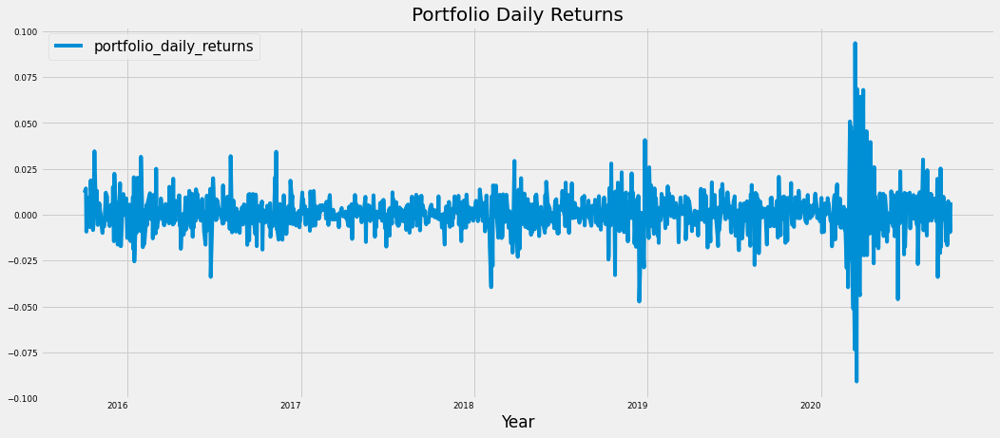

In [69]:
# Lets Plot the graph
plt.figure(figsize=(16,8))
stocks_returns['portfolio_daily_returns'].plot()
plt.title('Portfolio Daily Returns', fontsize = 20)
plt.legend(loc = 'best', fontsize = 15)
plt.xticks(rotation=0)
plt.xlabel("Year")
plt.show()

- As seen in the plot, the portfolio shows larger variation in prices from 2018 to 2019. 

### Cumulative return from the Portfolio

Cumulative return of an investment is the cumulative gain or loss from an investment over the given period of time. You can read about the cumprod() function here: https://www.geeksforgeeks.org/python-pandas-dataframe-cumprod/

In [70]:
# Cumulative return from the portfolio

daily_cumulative_returns = (1+stocks_returns).cumprod()
daily_cumulative_returns.tail(5)

,MSFT,JNJ,RHHBY,MRK,portfolio_daily_returns
Date,,,,,
2020-09-24,4.554808,1.552753,1.345575,1.684221,2.106791
2020-09-25,4.658597,1.563379,1.349187,1.679765,2.122417
2020-09-28,4.694911,1.578942,1.327815,1.676322,2.122342
2020-09-29,4.646043,1.578405,1.305539,1.658902,2.102224
2020-09-30,4.714862,1.597939,1.288682,1.680170,2.116465


This suggests that the portfolio has achieved a cumulative return of 1.11% in the given period

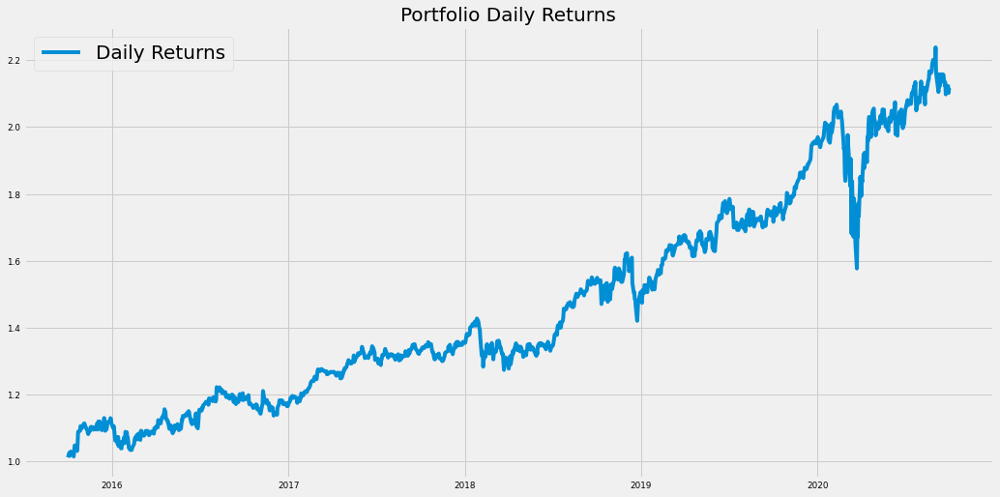

In [71]:
# Lets Plot the graph

plt.figure(figsize=(16,8))
plt.plot(daily_cumulative_returns['portfolio_daily_returns'], label = 'Daily Returns')
plt.title('Portfolio Daily Returns', fontsize = 20)
plt.legend(loc = 'best', fontsize = 20)
plt.show()

### Portfolio Risk – Portfolio Standard Deviation

For the portfolio standard deviation formula, we need three elements:
- Portfolio weight array
- Portfolio covariance matrix
- Transpose of portfolio weight array

The weight for each stock in the portfolio is already abailable. We need to calculate the daily covariance. Remember, the covariance must be annualised by **multiplying with 252 (the trading days in a year)**.

In [72]:
# Covariance matrix for the portfolio

# Removing the last column (Portfolio_Daily_Return) from our calculation.

covariance_matrix_portfolio = stocks_returns.iloc[:,:-1]
covariance_matrix_portfolio = (covariance_matrix_portfolio.cov())*252

covariance_matrix_portfolio

,MSFT,JNJ,RHHBY,MRK
MSFT,0.077524,0.028277,0.029796,0.029374
JNJ,0.028277,0.039117,0.019560,0.025844
RHHBY,0.029796,0.019560,0.046023,0.020306
MRK,0.029374,0.025844,0.020306,0.049865


In [73]:
# Applying the matrix operations mentioned in the image above
portfolio_variance = np.dot(initial_weight.T,np.dot(covariance_matrix_portfolio, initial_weight))

In [74]:
# Standard deviation (risk of portfolio)
portfolio_risk = np.sqrt(portfolio_variance)
portfolio_risk*100

18.007735387495938

### Sharpe Ratio

In [75]:
# Assuming that the risk free rate is zero
Sharpe_Ratio = (stocks_returns['portfolio_daily_returns'].mean() - daily_returns['S&P500'].mean()) / stocks_returns['portfolio_daily_returns'].std()
Sharpe_Ratio

0.012596079178261168

In [76]:
Annualised_Sharpe_Ratio = (252**0.5)*Sharpe_Ratio
Annualised_Sharpe_Ratio

0.19995655800094725

#### Total ROI from the Portfolio

In [77]:
invested_amount=500000
Cummulative_returns=daily_cumulative_returns['portfolio_daily_returns'][-1]
Expected_Return=invested_amount*Cummulative_returns
Expected_Return

1058232.526596428

In [78]:
Expected_Earning=Expected_Return-invested_amount
Expected_Earning

558232.5265964279

Mr.Patrick jyengar invests 500 Thousand Dollar on equities i.e the above Portfolio. Returns that he would fetch after 5 years is 1.58 Million Dollar with 558.23
Thousand dollar of gain


<a id="son"></a>
<h1>   
      <font >
            <span style='font-family:Georgia'>
            5.2. Peter Jyengar Portfolio
            </span>   
        </font>    
</h1>

## Mr. Peter Jyengar Portfolio Building

Mr. Peter Jyengar on the other hand Consistent with his attitude towards risk, he prefers high-return investments.Believes that he can still bounce back in case
of any occasional losses.He Wants to invest $1 million from company's cash and cash equivalents in the most high-margin stacksExpects high returns within 5
years for inorganic expansion of his company.
As per his profile High risk/High Returns stocks like AMZN and MSFT is suitable to invest on. Overall returns with these stocks would fetch him Maximum
returns and also cater the Risk.
rns associated with the above mentioned portfolio.


In [79]:
# Initial weight for each stock in order
stock = ['AMZN']

initial_weight = np.array([1])

In [80]:
# Lets create a dataset for selected stocks
portfolio_1 = data.copy()
portfolio_1 = portfolio_1[stock]

In [81]:
portfolio_1.tail()

,AMZN
Date,
2020-09-24,3019.790039
2020-09-25,3095.129883
2020-09-28,3174.050049
2020-09-29,3144.879883
2020-09-30,3148.729980


### Daily return from each stock

Daily return is the percentage change in the price of the stock from the previous day. This can be calculated using the percentage change in the price on a daily basis.

In [82]:
# Daily return from each stock 
stocks_returns = portfolio_1.pct_change()
stocks_returns.head(8)

,AMZN
Date,
2015-10-01,NaN
2015-10-02,0.022699
2015-10-05,0.020919
2015-10-06,-0.011404
2015-10-07,0.008298
2015-10-08,-0.016201
2015-10-09,0.012454
2015-10-12,0.019248


### Average daily return from each stock

Average daily return for each stock can be calculated using the dataframe created above - "stocks_returns"

In [83]:
# Average daily return from each stock
mean_stocks_daily_returns = stocks_returns.mean()
print(mean_stocks_daily_returns)

AMZN    0.001611
dtype: float64


## Risk of Stocks in Portfolio

In [84]:
stock_risk = stocks_returns.std()
stock_risk

AMZN    0.018969
dtype: float64

### Daily return from the portfolio

The weighted average can be calculated to determine the return from the portfolio on a daily basis.

In [85]:
# Portfolio daily returns
stocks_returns['portfolio_daily_returns'] = stocks_returns.dot(initial_weight)
stocks_returns

,AMZN,portfolio_daily_returns
Date,,
2015-10-01,NaN,NaN
2015-10-02,0.022699,0.022699
2015-10-05,0.020919,0.020919
2015-10-06,-0.011404,-0.011404
2015-10-07,0.008298,0.008298
2015-10-08,-0.016201,-0.016201
2015-10-09,0.012454,0.012454
2015-10-12,0.019248,0.019248
2015-10-13,-0.002345,-0.002345


### Total Portfolio Return

In [86]:
# We are calculating the total portfolio return

allocated_stocks_daily_returns = (initial_weight * mean_stocks_daily_returns)

portfolio_return = np.sum(allocated_stocks_daily_returns)
portfolio_return*100

0.16105339261582294

Average Daily Returns of Portfolio is 0.16%

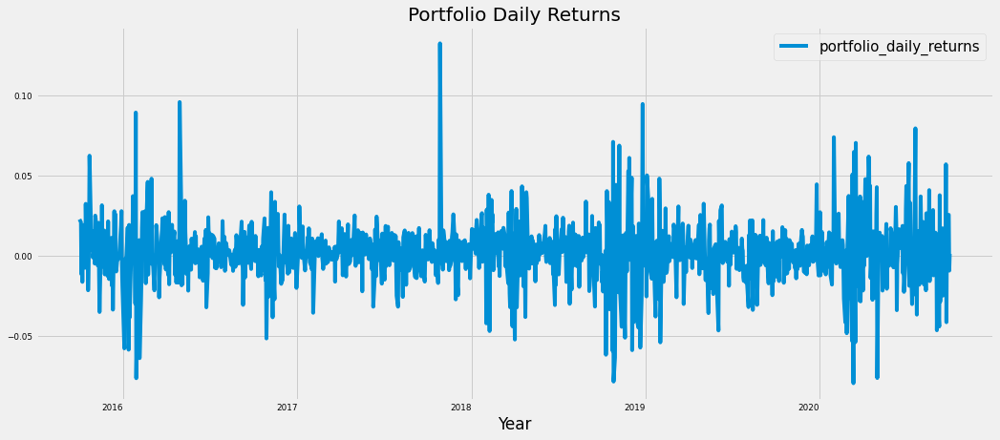

In [87]:
# Lets Plot the graph
plt.figure(figsize=(16,8))
stocks_returns['portfolio_daily_returns'].plot()
plt.title('Portfolio Daily Returns', fontsize = 20)
plt.legend(loc = 'best', fontsize = 15)
plt.xticks(rotation=0)
plt.xlabel("Year")
plt.show()

- As seen in the plot, the portfolio shows larger variation in prices from end of 2017 to 2020. 

### Cumulative return from the Portfolio

Cumulative return of an investment is the cumulative gain or loss from an investment over the given period of time. You can read about the cumprod() function here: https://www.geeksforgeeks.org/python-pandas-dataframe-cumprod/

In [88]:
# Cumulative return from the portfolio

daily_cumulative_returns = (1+stocks_returns).cumprod()
daily_cumulative_returns.tail(5)

,AMZN,portfolio_daily_returns
Date,,
2020-09-24,5.799259,5.799259
2020-09-25,5.943943,5.943943
2020-09-28,6.095503,6.095503
2020-09-29,6.039484,6.039484
2020-09-30,6.046878,6.046878


This suggests that the portfolio has achieved a cumulative return of 5.04% in the given period

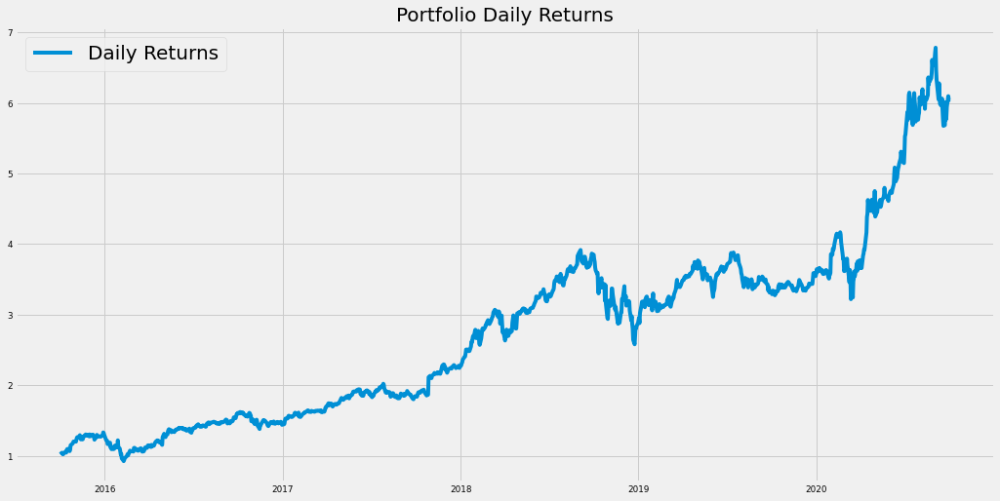

In [89]:
# Lets Plot the graph

plt.figure(figsize=(16,8))
plt.plot(daily_cumulative_returns['portfolio_daily_returns'], label = 'Daily Returns')
plt.title('Portfolio Daily Returns', fontsize = 20)
plt.legend(loc = 'best', fontsize = 20)
plt.show()

### Portfolio Risk – Portfolio Standard Deviation

For the portfolio standard deviation formula, we need three elements:
- Portfolio weight array
- Portfolio covariance matrix
- Transpose of portfolio weight array

The weight for each stock in the portfolio is already abailable. We need to calculate the daily covariance. Remember, the covariance must be annualised by **multiplying with 252 (the trading days in a year)**.

In [90]:
# Covariance matrix for the portfolio

# Removing the last column (Portfolio_Daily_Return) from our calculation.

covariance_matrix_portfolio = stocks_returns.iloc[:,:-1]
covariance_matrix_portfolio = (covariance_matrix_portfolio.cov())*252

covariance_matrix_portfolio

,AMZN
AMZN,0.090671


In [91]:
# Applying the matrix operations mentioned in the image above
portfolio_variance = np.dot(initial_weight.T,np.dot(covariance_matrix_portfolio, initial_weight))

In [92]:
# Standard deviation (risk of portfolio)
portfolio_risk = np.sqrt(portfolio_variance)
portfolio_risk*100

30.111660201498957

### Sharpe Ratio

In [93]:
# Assuming that the risk free rate is zero
Sharpe_Ratio = (stocks_returns['portfolio_daily_returns'].mean() - daily_returns['S&P500'].mean()) / stocks_returns['portfolio_daily_returns'].std()
Sharpe_Ratio

0.0576241626497662

In [94]:
Annualised_Sharpe_Ratio = (252**0.5)*Sharpe_Ratio
Annualised_Sharpe_Ratio

0.9147552232777089

#### Total ROI from the Portfolio

In [95]:
invested_amount=1000000
Cummulative_returns=daily_cumulative_returns['portfolio_daily_returns'][-1]
Expected_Return=invested_amount*Cummulative_returns
Expected_Return

6046877.698877438

In [96]:
Expected_Earning=Expected_Return-invested_amount
Expected_Earning

5046877.698877438

Mr.Peter jyengar invests 1 Million Dollar on equities i.e the above Portfolio. Returns that he would fetch after 5 years is more than 6 Million Dollars with 5+ Million dollars of gain

<a id="conclusion"></a>
<h1>   
      <font >
            <span style='font-family:Georgia'>
            6. Conclusion:
            </span>   
        </font>    
</h1>


1. In this Notebook we have explored stock prices of tech stocks, pharma stocks, Aviation stocks, finance stocks & market Index also. We have looked at the historical price of stock price.We have looked at the volume of stock traded.


2. We have looked at the daily Return of stock.We have done correlation between the stock prices.Microsoft and Amazon have highest daily price correlation.maximum daily fluctuation in ths stock is 8 % .In stock exchange there is a limit on per day fluctuation of stock.So if the stock reaches the threshold value then the trading of the stock is stopped for that day.


3. Stock with Low risk and high return are the best stock to buy. We can see that Amazon Stock has high risk and high returns.